# **CS372 Assignment 2: Decision Tree**

### Group 03
### **Students Names:**
- Liew Wan Yue
- Herman Soh
- Timothy James Lim
- Kui Xuan Marc Soo

# **Summary**

This assignment is on applying the group's knowledge and learning on Decision Tree to a dataset that has different types of features, as well as to evaluate and analyse the performance and accuracy of the different kinds of Decision Tree (Gini and Entropy).

The problem decription / case study is that a bank wants to identify customers who have a higher probability of purchasing personal loan, by building a Decision Tree model prediction based on their customer dataset.

The assigment goes through the different steps of building the model, which includes data analysis and pre-processing, building the Decision Trees, evaluating the model and tree pruning.

## **Question 1**

- Download the **Bank Personal Loan Information** data from course Moodle.
- Load Data from CSV file to ['Pandas data frame'](https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html).
- To implement your Decision tree model, you need to:
    - Identify your target feature and descriptive features. In our case, Personal Loan will be our target feature and the rest of the features (descriptive features) will be used to predict Personal loan.

#### Import Libraries

In [1]:
# pandas: Data analysis and data manipulation tool that works well with structured data such as tables or excel spreadsheets.
import pandas as pd 

# numpy: Provides support for large, multi-dimensional arrays and matrices as well as mathematical functions to operate on arrays.
import numpy as np 

# seaborn: Provides interface for creating statistical graphics and visualizing complex datasets.
import seaborn as sns 

# matplotlib.pyplot: Used for animated visualisations like plotting, customization of titles, labels and legends.
import matplotlib.pyplot as plt 

# time: Provides various time-related functions 
import time

# tree: Module that provide tools for working with decision trees.
from sklearn import tree

# ColumnTransformer: Selectively apply data transforms to different columns/column subsets in dataset.
from sklearn.compose import ColumnTransformer 

# OneHotEncoder: Creates binary column for each categorical (discrete) feature.
# StandardScalar: Remove the mean and scaling to unit variance, to ensure all features have the same scale.
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# train_test_split: Split arrays or matrices into random train and test subsets. 
# GridSearchCV: used to tune hyperparamter
# cross_val_score: to perform cross-validation during evaluation of models
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

# DecisionReeClassifier: Decision Tree Model to make predictions.
# plot_tree: used to visualize decision trees by understanding and intepreting the structure and decisions. 
from sklearn.tree import DecisionTreeClassifier, plot_tree

# KNNImputer: Impute missing values in a datset using k-Nearest Neighbours algorithm.
from sklearn.impute import KNNImputer

# accuracy_score: accuracy classification score, computes subset accuracy.
# confusion_matrix: computes confusion matrix to evaluate accuracy of classification 
from sklearn.metrics import accuracy_score, confusion_matrix

# KNeighboursClassifier: supervised learning algorithm for classification tasks based on KNN 
from sklearn.neighbors import KNeighborsClassifier


#### Load Bank Personal Loan Information Data

In [2]:
# Load the dataset from the second sheet named "Data"
ds = pd.read_excel("Personal Loan Data_DT.xlsx", sheet_name='Data', header=0, index_col=0)
ds.info()
ds.head(5000)

### Timothy James Lim ###

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 228 to 223
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Experience          4998 non-null   float64
 2   Income              5000 non-null   int64  
 3   ZIP Code            5000 non-null   int64  
 4   Family              5000 non-null   int64  
 5   CCAvg               5000 non-null   float64
 6   Education           4996 non-null   object 
 7   Mortgage            5000 non-null   int64  
 8   Personal Loan       5000 non-null   int64  
 9   Securities Account  5000 non-null   int64  
 10  CD Account          5000 non-null   int64  
 11  Online              5000 non-null   int64  
 12  CreditCard          5000 non-null   int64  
dtypes: float64(2), int64(10), object(1)
memory usage: 546.9+ KB


,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
ID,,,,,,,,,,,,,
228,47,23.0,148,94551,2,7.5,Undergrad,0,0,0,1,1,1
230,48,24.0,71,93117,2,1.7,Undergrad,145,0,0,0,0,1
234,62,37.0,58,91320,4,1.7,Undergrad,0,0,0,0,1,0
239,57,32.0,28,95831,3,0.2,Undergrad,0,0,0,0,1,1
241,51,26.0,70,90089,1,1.2,Undergrad,169,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
216,38,14.0,92,95818,2,0.0,Undergrad,249,0,0,0,1,1
217,27,3.0,125,95521,2,0.6,Undergrad,0,0,0,0,0,0
218,39,14.0,74,94305,3,3.0,Undergrad,0,0,0,0,0,0


### **[15 points]** Exploratory Data Analysis
1. **[6 points]** Check for:
    - **[2 points]** ['duplicates'](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.duplicated.html), show the last duplicates. Choose one of the methods we studied in the class to deal with duplicate records (if any) and explain how and why you did that.
    - **[2 points]** ['missing data'](https://pandas.pydata.org/docs/reference/api/pandas.isnull.html) in the data frame. Choose one of the methods we studied in the class to deal with missing values, if any. Make sure to explain what you used to fill out missing data. Note that zero is a value not missing data.
    - **[2 points]** Check for Outliers using ['Boxplot'](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.boxplot.html) graphs. Make sure to add necessary labels for each plot. Upon detection, show and explain how you dealt with outliers, justify your choice.
3. **[4 points]** Draw ['scatter plot'](https://seaborn.pydata.org/examples/scatterplot_matrix.html) matrix for all features and comment on the plot.
4. **[5 points]** ['Heatmap correlation'](https://seaborn.pydata.org/generated/seaborn.heatmap.html): Draw a heatmap plot between all independent variables and dependent variables. Comment on your heatmap (i.e. the strength and the direction of the correlation between features).

#### **1.** Check Duplicate Data

In [3]:
duplicates = ds[ds.duplicated(keep=False)]  # In-built library to check for duplicate rows
print(duplicates)

### Timothy James Lim ###

Empty DataFrame
Columns: [Age, Experience, Income, ZIP Code, Family, CCAvg, Education, Mortgage, Personal Loan, Securities Account, CD Account, Online, CreditCard]
Index: []


#### Handle Duplicate Data

In [4]:
ds.drop_duplicates(inplace=True) # Drop duplicate data

### Timothy James Lim ###

#### **Explain how you dealt with duplicates**

Explain how you dealt them, why, and justify your choice here.
---
The group decided to drop the duplicate data. 

Looking at the printed output for the duplicates, it indicates that there is no duplicate data. So there isn't any data that is being dropped. However, when the group removed the ZIP Code feature from consideration, there were some instances that are duplicates. But the group felt that there is possibility that instances can have the same descriptive features, just with different ZIP Codes. So overall, there are still no duplicate data to drop.

#### Check Missing Data

In [5]:
# Removing Zip Code as it is not useful for prediction
ds = ds.drop(columns=['ZIP Code'])

print('Missing values before Experiences:')
missing = ds[ds.isnull().any(axis=1)] 
print(missing)

# Check missing data and show the records
# Delete all Experience that are negative and predict these as well
ds['Experience'] = ds['Experience'].apply(lambda x: np.nan if x < 0 else x)

print('')
print('Missing values after deleting NA Experiences:')
missing_data = [] # This variable is used to store the IDs with missing values
for i in range(len(ds)):
    for j in ds.columns:
        if pd.isnull(ds.loc[ds.index[i],j]):
            #print(f"Index: '{ds.index[i]}' Column: '{j}' is blank")
            missing_data.append(ds.index[i])
            
missing = ds[ds.isnull().any(axis=1)] 
print(missing)

### Timothy James Lim ###

Missing values before Experiences:
      Age  Experience  Income  Family  CCAvg  Education  Mortgage  \
ID                                                                  
400    28         NaN      84       4    0.2  Undergrad         0   
1020   29         NaN      30       4    0.3   Graduate       157   
1      25         1.0      49       4    1.6        NaN         0   
144    25         1.0      54       4    1.6        NaN         0   
184    29         3.0     148       3    4.1        NaN         0   
223    26         2.0     104       3    2.5        NaN         0   

      Personal Loan  Securities Account  CD Account  Online  CreditCard  
ID                                                                       
400               0                   0           0       1           1  
1020              0                   0           0       0           0  
1                 0                   1           0       0           0  
144               0                   0   

#### Handle Missing Data

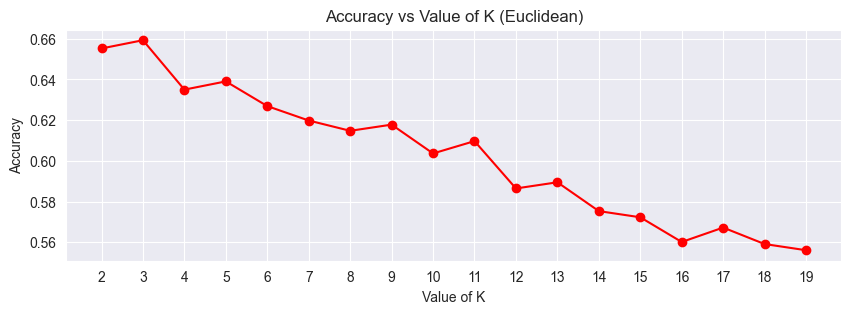

Highest Accuracy (Euclidean): 0.66, K: 3


,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
ID,,,,,,,,,,,,
228,47.0,23.0,148.0,2.0,7.5,1.0,0.0,0,0,1,1,1
230,48.0,24.0,71.0,2.0,1.7,1.0,145.0,0,0,0,0,1
234,62.0,37.0,58.0,4.0,1.7,1.0,0.0,0,0,0,1,0
239,57.0,32.0,28.0,3.0,0.2,1.0,0.0,0,0,0,1,1
241,51.0,26.0,70.0,1.0,1.2,1.0,169.0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
216,38.0,14.0,92.0,2.0,0.0,1.0,249.0,0,0,0,1,1
217,27.0,3.0,125.0,2.0,0.6,1.0,0.0,0,0,0,0,0
218,39.0,14.0,74.0,3.0,3.0,1.0,0.0,0,0,0,0,0


In [6]:
# handle the missing data
# Prepare dataset for KNNImputation, this will use KNN to fill in the missing categorical values
df = ds.copy()

# Encode all the education 
education_encode = {'Undergrad' : 1, 'Graduate' : 2, 'Professional' : 3}
df['Education'] = df['Education'].map(education_encode) # df is the encoded dataset with the missing values

# Removing features that might not be useful to predict experience and education
df_dropped = df.drop(['Securities Account', 'CD Account', 'Personal Loan', 'Online', 'CreditCard'], axis=1) # df_dropped will be used to calculate the missing values

# Creating a copy of the dataframe to be manipulated by KNN
knn_df = df_dropped.copy() 

# Drop empty values, this will be used for the knn
knn_df.dropna(inplace=True)

# Split the dataset 80/20
x = knn_df.drop(['Education'], axis=1)
y = knn_df['Education']
x_scaled = StandardScaler().fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, train_size=0.8, random_state=0, stratify=y)

high_acc = 0.0 # Variable for highest accuracy score
nh = 0 # K value with the highest accuracy
accuracies = [] # Array to store accuracy scores

# Find the best value of K for KNNImpute using KNN on a validation set
for n in range(2,20):
    knn1 = KNeighborsClassifier(n_neighbors=n, weights='uniform', algorithm='auto', metric='euclidean')
    knn1.fit(x_train, y_train)
    x_pre = knn1.predict(x_test)

    accuracy = accuracy_score(y_test, x_pre)
    accuracies.append(accuracy)
    # print(f"Accuracy: {accuracy:.2f}, n_neighbour: {n}")
    if accuracy > high_acc:
        high_acc = accuracy
        nh = n
        
# Print out accuracy chart to k value
plt.figure(figsize=(10, 3))
plt.plot(range(2,20), accuracies, marker='o',  linestyle='-', color='r')
plt.xlabel('Value of K')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Value of K (Euclidean)')
plt.xticks(range(2,20))
plt.grid(True)
plt.savefig('AvK(Euclidean).jpg', format='jpg')
plt.show()

print(f"Highest Accuracy (Euclidean): {high_acc:.2f}, K: {nh}")

# Initialize and set N value, dont use 1 to prevent over-fitting. 
knn_imputation = KNNImputer(n_neighbors=nh)

# Execute the KNN Imputation for the dataset
garbage_out = knn_imputation.fit_transform(df_dropped) # garbage_out is the encoded dataset with the categorised values

# Convert the new dataset into a DataFrame
corrected_df = pd.DataFrame(garbage_out, columns=df_dropped.columns, index=df_dropped.index) 

for column in df_dropped.columns:
    df[column] = corrected_df[column]
#print(df)

corrected_df = df.copy()
corrected_df.head(5000)

### Timothy James ###

#### **Explain how you dealt with missing data**

Explain how you dealt them, why, and justify your choice here.

Answer:
---
For the missing data, it was mainly 2 features that had missing (NaN) value, which were Experience and Education. However, the group found out that there were also unapplicable data values in the Experience column, where there were negative values for years of exeperience. The group choose to also treat those data values as missing values, as they would not give accurate data if left as negative values.

The group dealt with all the missing values by using KNN to predict the values. For the Experience column, which is a categorical feature, the group used one hot encoding to have numerical values for each categorcial variable. 

The group first find the most accurate K value by splitting the dataset 80/20, and then running KNN using the chosen value. Finishing off, the group decoded back the Exeperience feature and inserting the new values into the original dataset.

#### Draw Box Plot

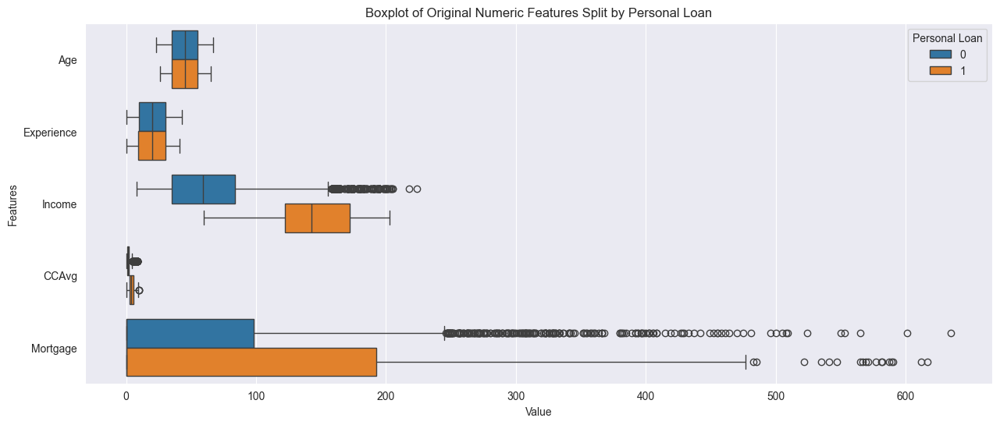

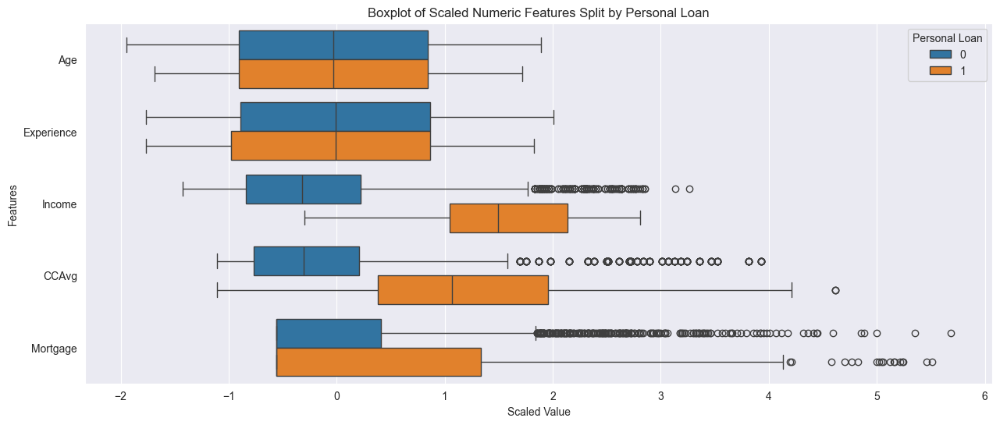

In [7]:
# Define continuous features
continuous_features = ['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']

# Combine the data for both Personal Loan = 0 and 1
corrected_df_long = corrected_df.melt(id_vars='Personal Loan', value_vars=continuous_features, 
                                      var_name='Feature', value_name='Value')

# Plot the combined boxplot for original values
plt.figure(figsize=(15, 6))
sns.boxplot(x='Value', y='Feature', hue='Personal Loan', data=corrected_df_long, orient='h')
plt.title('Boxplot of Original Numeric Features Split by Personal Loan')
plt.xlabel('Value')
plt.ylabel('Features')
plt.legend(title='Personal Loan', loc='upper right')
plt.show()

# Scale the continuous features
scaler = StandardScaler()
corrected_df_scaled_numeric = scaler.fit_transform(corrected_df[continuous_features])
corrected_df_scaled = pd.DataFrame(corrected_df_scaled_numeric, columns=continuous_features)
corrected_df_scaled['Personal Loan'] = corrected_df['Personal Loan'].values

# Combine the scaled data for both Personal Loan = 0 and 1
corrected_df_scaled_long = corrected_df_scaled.melt(id_vars='Personal Loan', value_vars=continuous_features, 
                                                    var_name='Feature', value_name='Value')

# Plot the combined boxplot for scaled values
plt.figure(figsize=(15, 6))
sns.boxplot(x='Value', y='Feature', hue='Personal Loan', data=corrected_df_scaled_long, orient='h')
plt.title('Boxplot of Scaled Numeric Features Split by Personal Loan')
plt.xlabel('Scaled Value')
plt.ylabel('Features')
plt.legend(title='Personal Loan', loc='upper right')
plt.show()

### Liew Wan Yue ###

#### **Explain how Box Plot consider outliers in the dataset**

Add comments here

Answer:
---
The data set, as represented by the box plot, is divided into four parts Q1, Q2, Q3 and Q4. Q2 is the median and divides the data into two parts. Q1 is the lower quartile which is the median of the data set in the lower half while Q3 is the upper quartile and is the median of the data set in the upper half. The interquartile range (IQR)  is calculated by subtracting Q1 from Q3 (Q3 - Q1). 

To calculate if a value will be an outlier we can take value x to represent a a data point in a data set. Q1, Q2, Q3 and IQR are calculated based on the data set given. The formula below is used to consider outliers in a dataset. 

Q1 - (1.5 x IQR) > x > Q3 + (1.5 x IQR)

x will be considered an outlier if it is less than Q1 - (1.5 x IQR) or greater than Q3 + (1.5 x IQR). 

#### **Analyze and comment on the box plot**

Add comments here

Answer:
---
There are 5 features, Age, Experience, Income, CCAvg, Mortgage.  represented by 4 box plots.

### Standardization of box plot
The first boxplot is plotted using the original continuous data while the second boxplot uses the scaled data. As the range for Mortgage is much bigger than the other features, it made the boxplot of other features like CCAvg hard to read. The group decided to scale the features using standard scalar to make the boxplot for all numeric features easier to read and analyse the trend.

### Age
For the feature Age, personal loan(PL) with value 0 and 1 have the same median age and, Q1 and Q3 have the same value. Both box plots are symmetrical. However, PL value 0 has longer whiskers than that of PL value 1, indicating it has a larger distribution. 

### Experience
For experience, PL value 0 and 1 have the same median and Q3 value. The Q1 of PL value 0 is slightly less than that of PL value 1 while the upper whisker of PL value 0 is slightly more than that one PL value 1. PL value 0 is symetrical while PL value 1 is slightly negatively skewed. Compatritively, PL value 0 has a larger distributiont.

### Income
The median, Q1 and Q3 of PL value 1 for income is significantly higher than that of PL value 0. PL value 0 is relatively symmetric while PL value 1 is slightly positively skewed. PL value 1 does not have any outliers but PL value 0 has many outliers on the positive side of it, indicating high variablity and a large distribution. 

### CCAvg
PL value 0 and PL value 1 for CCAvg have very similar lower whisker values, however PL value 1 has significantly higher values of median, Q1, Q3 and upper whisker than PL value 0. PL value 0 has many outliers spanning accross different values while PL value 1 has one outlier. Both PL value 0 and 1 have a relatively large distribution. 

(mortgage) PL value 0  

Age and experience do not have any outliers. Income, CCAvg and Mortgage have outliers. Income has an upper whisker of 186.5 and outliers spanning to a value of 224. CCAvg has an upper whisker of 5.2 and outliers spanning to a value of 10. Mortgage has an upper whisker of 252.5 and outliers spanning to a value of 635. There is an abnormally large number of outliers for these three features with mortgage being the most extreme followed by CCAvg and Income. 

#### **3.** Plot Scatter Matrix

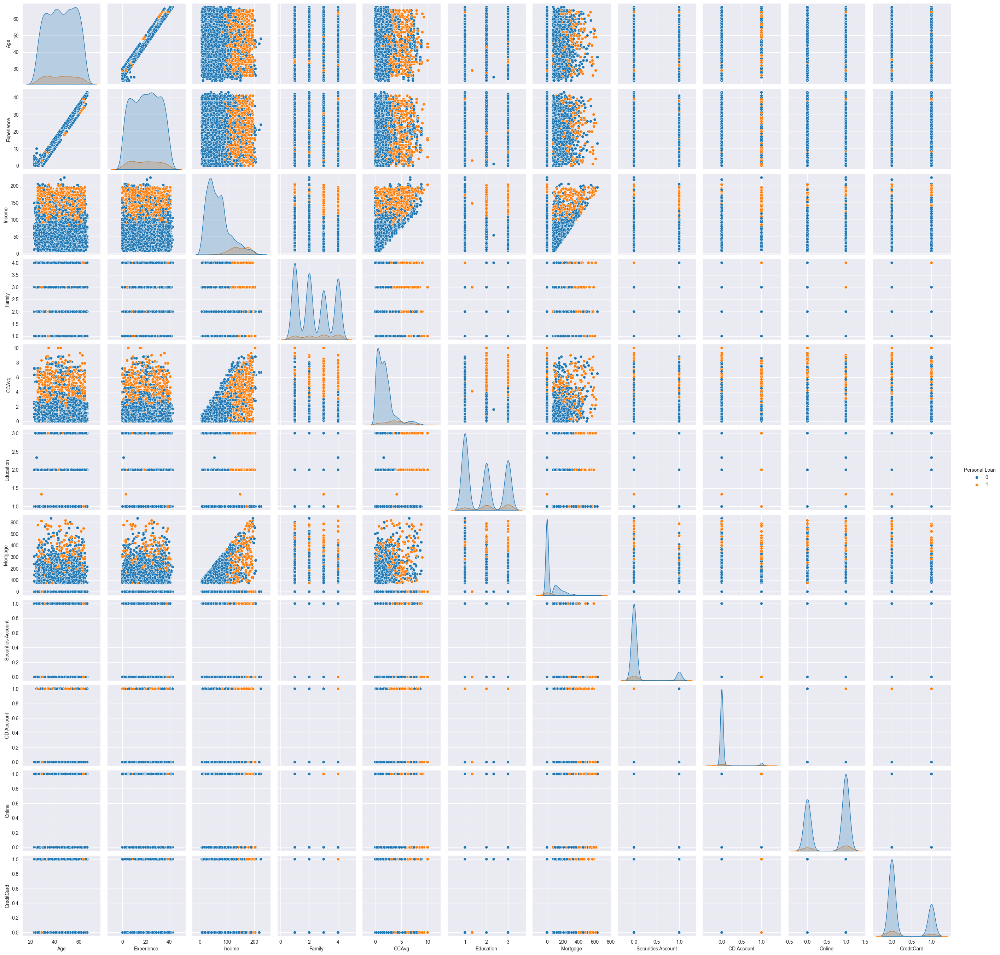

In [8]:
# Generate a scatterplot matrix
sns.pairplot(corrected_df, hue = 'Personal Loan') #hue as personal loan because it is our target variable
plt.savefig('scatterplot_matrix.jpg', format='jpg') 
plt.show()

### Liew Wan Yue ###

#### **Analyze and comment on the scatter matrix plot**

Answer:
---
The scatterplot matrix represents the relationship between pairs of features in the dataset Age, Experience, Income, Family, CCAvg, Education, Mortgage, Securities Account, CD Account, Online and Credit Card. Each scatterplot is colour based on personal loan value 1 or 0. 

### Relationship between two features
There is a strong positive linear relationship between age against experience, indicating that people generally gain more experience as they age. 

There a positive corelation between Income against CCAvg and Income against Mortgage. This indicates that individuals with higher income generally have higher average credit card spending. It also suggests that individuals with higher income tend to have higher mortgage, however the relationship is not as apparent as that of income against CCAvg.

There is a scattered relationship for age and experience against income. 

Family shows clustering due to categorical values while education shows a clear separation into distinct groups representing categorical values of different education levels.

### Relationships regarding personal loans
Observing segregation based on personal loan value 0 and 1, there are several correlations with the features.

Higher income, CCAvg and education level are associated to taking a personal loan. Generally, individuals with higher mortage are more likely to take a personal loan than those with lower mortage but the separation is not clear. 

### Generalization
Income and CCAvg are stronger indicators of the likelihood of individuals taking a personal loan. 

#### **4.** Plot Heatmap Correlation

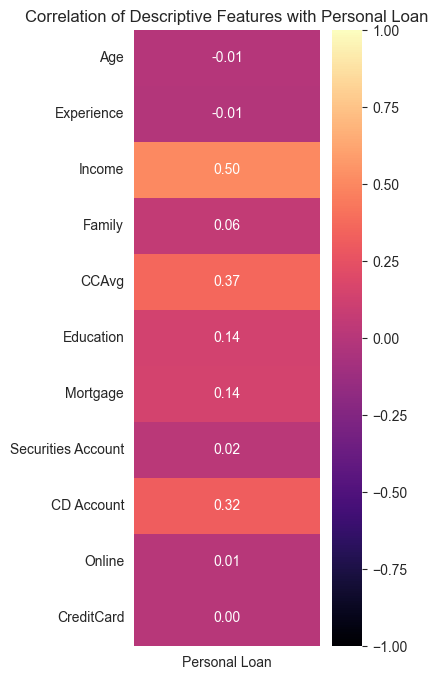

In [9]:
# Encode categorical variables into binary columns using one-hot encoding, dropping the first category
encoded_corrected_df = pd.get_dummies(corrected_df, drop_first=True)

# Compute the correlation matrix for the encoded dataset
correlation_matrix = encoded_corrected_df.corr()

# Extract correlations with the 'Personal Loan' column
personal_loan_correlation = correlation_matrix[['Personal Loan']].drop('Personal Loan')

# Plot the heatmap for 'Personal Loan' correlations
plt.figure(figsize=(3, 8))
sns.heatmap(personal_loan_correlation, annot=True, fmt=".2f", cmap='magma', vmin=-1, vmax=1)
plt.title('Correlation of Descriptive Features with Personal Loan')
plt.show()

### Liew Wan Yue ###

#### **Analyze and comment on the heatmap correlation plot**

Answer:
---
The heat map shows the correlation coefficients between the features Age, Experience, Income, Family, CCAvg, Education, Mortgage, Securities Account, CD account, Online and Credit Card with the target feature personal loan. The higher 1 and -1 show perfect positive correlation and perfect negative correlation respectively while 0 indicated no correlation. 

### Income
The feature with the highest correlation is Income with a correlation coefficient value of 0.50, this indicates that a higher income is strongly positively correlated to a higher likelihood of taking a personal loan. 

### CCAvg and CD account
The feature CCAvg and CD account have relatively high correlations with correlation coefficient values 0.37 and 0.32 respectively. This indicates that a higher CCAvg and having a CD account is moderately positively correlated to an individual taking a personal loan. 

### Mortgage, Education and Family 
The feature mortgage has a weak correlation to taking a personal loan with a correlation coefficient value of 0.14. The features Education, Family have a very weak correlation with coefficient values of 0.07 and 0.06 respectively. 

### Securities account, Online, Experience, Age and Credit Card
The feautres Securities account and Online have an almost negligable positive correlation with taking a personal loan and have coefficient values of 0.02 and 0.01 respectively. Both Experience and Age have an alomost negligable negative correlation with coefficient values of -0.01. Credit Card has no correlation with taking a personal loan and has a coefficient value of 0. 

### Decision Tree **[33 points]**

1. **[10 points]** To use categorical data with scikit-learn in Decision Trees, we have to use the One-Hot Encoding trick to convert categorical columns into multiple columns of binary values. There are two popular methods that you could use for this purpose, namely:
    - [ColumnTransformer()](https://scikit-learn.org/stable/modules/generated/sklearn.compose.ColumnTransformer.html) (from scikit-learn)
    - [get_dummies()](https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html) (from pandas)
    - **Note that** One-Hot Encoding converts a column with more than 2 categories, and hence, we don’t need to process categorical features with only two categories.
2. **[3 points]** [Split your dataset 80/20](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html#sklearn.model_selection.train_test_split).  Train the model on the 80% fraction and then evaluate the accuracy on the 20% fraction. Make sure that if I run the algorithm again, I will get the same split and also the proportion of the classes are preserved in the split. Shuffle the data before split.
3. **[10 points]** Build and Compare two Decision Trees, [based on](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier):
    - **[5 points]** Gini Impurity.
    - **[5 points]** Entropy.
4. **[10 points]** [Visualize](https://scikit-learn.org/stable/modules/generated/sklearn.tree.plot_tree.html#sklearn.tree.plot_tree) the fully grown Decision Trees you built (tree graph). (5 points for each tree)

#### **1.** One-Hot Encoding: convert categorical columns into multiple columns of binary values

In [10]:
# Sample data with exactly three rows
data = {
    'Education': ['Graduate', 'Professional', 'Undergrad']
}
X = pd.DataFrame(data)

# Identify and define the categorical columns
categorical_cols = ['Education']

# Apply One-Hot Encoding using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_cols)  # One-hot encode the categorical columns
    ],
    remainder='passthrough'  # Leave the other columns unchanged
)

# Transform the data
X_transformed = preprocessor.fit_transform(X)

# Get the feature names
encoded_feature_names = preprocessor.get_feature_names_out()

# Convert back to a DataFrame for easier manipulation
X_transformed_df = pd.DataFrame(X_transformed, columns=encoded_feature_names)

# Display the transformed DataFrame
print(X_transformed_df)

### Herman Soh ###

   cat__Education_Graduate  cat__Education_Professional  \
0                      1.0                          0.0   
1                      0.0                          1.0   
2                      0.0                          0.0   

   cat__Education_Undergrad  
0                       0.0  
1                       0.0  
2                       1.0  


#### **2.** Split your data 80/20 (Shuffle and Split)

In [11]:
# Prepare the dataset for model training and evaluation

# Step 1: Separate the features and target variable
X = corrected_df.drop('Personal Loan', axis=1)  # Features (all columns except 'Personal Loan')
y = corrected_df['Personal Loan']  # Target variable

# Step 2: Apply One-Hot Encoding to categorical features using the predefined preprocessor
X_transformed = preprocessor.fit_transform(X)

# Step 3: Convert the transformed data back to a DataFrame for easier manipulation
X_transformed_df = pd.DataFrame(X_transformed, columns=preprocessor.get_feature_names_out())

# Step 4: Split the dataset into training (80%) and testing (20%) sets
# Use stratified sampling to preserve the proportion of the target classes in both sets
X_train, X_test, y_train, y_test = train_test_split(X_transformed_df, y, test_size=0.2, random_state=42, stratify=y)

### Herman Soh ###

#### **3.** Build Decision Trees: Gini Impurity

In [12]:
# Train and evaluate Decision Tree using Gini Impurity with and without pre-pruning

# Define the function to train and evaluate the decision tree
def train_evaluate_tree(tree, X_train, y_train, X_test, y_test):
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy, y_pred

# Initialize and train the original Decision Tree using Gini Impurity
original_gini_tree = DecisionTreeClassifier(criterion='gini', random_state=42)
original_gini_accuracy, y_pred_original_gini = train_evaluate_tree(original_gini_tree, X_train, y_train, X_test, y_test)
print(f"Original Decision Tree (Gini) Accuracy: {original_gini_accuracy:.4f}")

# Initialize and train the pre-pruned Decision Tree using Gini Impurity
prepruned_gini_tree = DecisionTreeClassifier(criterion='gini', random_state=42, max_depth=5, min_samples_split=10, min_samples_leaf=5)
pruned_gini_accuracy, y_pred_pruned_gini = train_evaluate_tree(prepruned_gini_tree, X_train, y_train, X_test, y_test)
print(f"Pre-pruned Decision Tree (Gini) Accuracy: {pruned_gini_accuracy:.4f}")

### Kui Xuan Marc Soo ###

Original Decision Tree (Gini) Accuracy: 0.9710
Pre-pruned Decision Tree (Gini) Accuracy: 0.9770


#### Build Decision Trees: Entropy

In [13]:
# Define the function to train and evaluate the decision tree
def train_evaluate_tree(tree, X_train, y_train, X_test, y_test):
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy, y_pred

# Original Decision Tree using Entropy
original_entropy_tree = DecisionTreeClassifier(criterion='entropy', random_state=42)
original_entropy_accuracy, y_pred_original_entropy = train_evaluate_tree(original_entropy_tree, X_train, y_train, X_test, y_test)
print(f"Original Decision Tree (Entropy) Accuracy: {original_entropy_accuracy:.4f}")

# Pre-pruned Decision Tree using Entropy
pre_pruned_entropy_tree = DecisionTreeClassifier(criterion='entropy', random_state=42, max_depth=5, min_samples_split=20, min_samples_leaf=10)
pruned_entropy_accuracy, y_pred_pruned_entropy = train_evaluate_tree(pre_pruned_entropy_tree, X_train, y_train, X_test, y_test)
print(f"Pre-pruned Decision Tree (Entropy) Accuracy: {pruned_entropy_accuracy:.4f}")

# Ensure the encoded_feature_names are correct and include all necessary columns
encoded_feature_names = preprocessor.get_feature_names_out()

# Function to replace 'remainder_' in feature names
def replace_remainder(feature_names):
    return [name.replace('remainder_', '') for name in feature_names]

# Get modified feature names
modified_feature_names = replace_remainder(encoded_feature_names)

print(modified_feature_names)

### Kui Xuan Marc Soo ###


Original Decision Tree (Entropy) Accuracy: 0.9750
Pre-pruned Decision Tree (Entropy) Accuracy: 0.9790
['cat__Education_1.0', 'cat__Education_1.3333333333333333', 'cat__Education_2.0', 'cat__Education_2.3333333333333335', 'cat__Education_3.0', '_Age', '_Experience', '_Income', '_Family', '_CCAvg', '_Mortgage', '_Securities Account', '_CD Account', '_Online', '_CreditCard']


#### **Analyze and compare two Decision Trees**

Analyze and compare two Decision Tress

Answer:
---
The grouped used the DecisonTreeClassifier class to perform classification of Personal Loan using the dataset.

For both Gini and Entropy DTs, it is relatively simple to execute, where it just needs to initialise the DecisionTreeClassifier to 'gini'/'entropy' criterion and fit and predict using the test and train datasets.

From running both DTs through the accuracy_score function, it shows that both DTs are almost similar in accuracy with a slight edge to the Entropy DT with an accuraccy of 0.9848, compared to the Gini DT with an accuracy of 0.9838.

#### **4.** Visualize the fully grown Decision Trees (Gini Impurity)

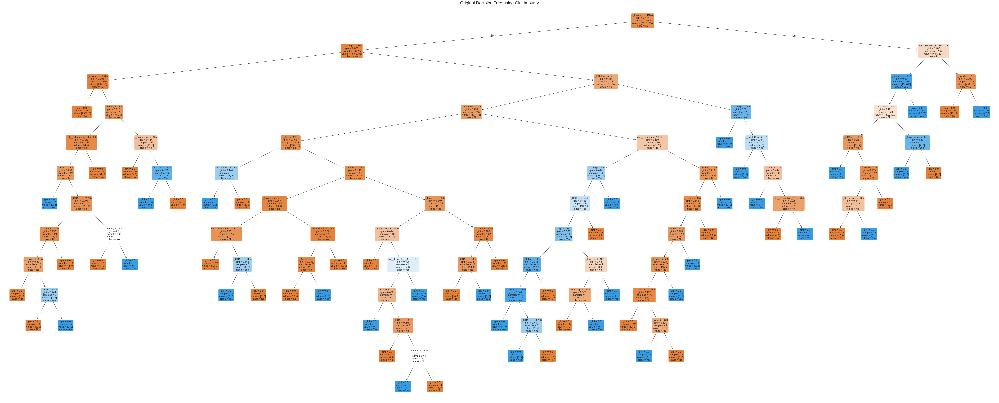

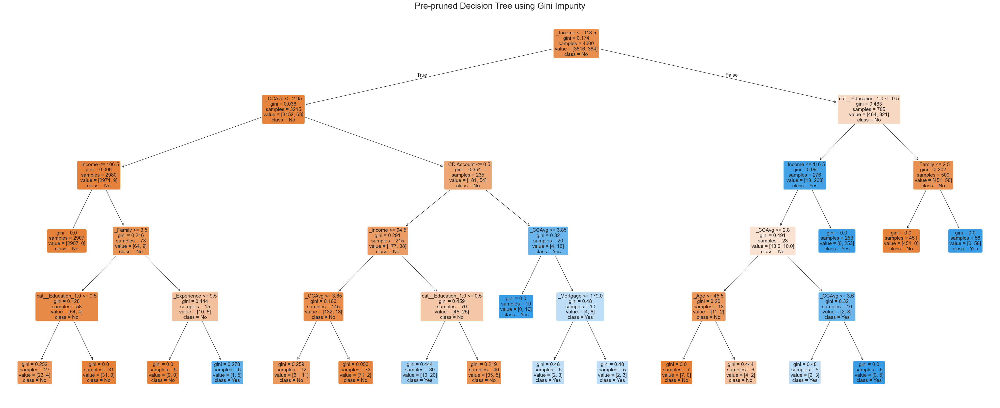

In [14]:
# Function to plot the decision trees with enhanced clarity
def plot_tree_with_clarity(tree_classifier, title, file_name, figsize):
    plt.figure(figsize=figsize)  # Use the provided figure size for better readability
    plot_tree(tree_classifier, filled=True, feature_names=modified_feature_names,
              class_names=['No', 'Yes'], rounded=True, fontsize=14)
    plt.title(title, fontsize=24)  # Increase the title font size
    plt.savefig(file_name, format='jpg')
    plt.show()
    
# Plot the normal Decision Tree with enhanced clarity
plot_tree_with_clarity(original_gini_tree, "Original Decision Tree using Gini Impurity", 'giniimpure.jpg', figsize=(100, 40))

# Plot the pre-pruned Decision Tree with enhanced clarity
plot_tree_with_clarity(prepruned_gini_tree, "Pre-pruned Decision Tree using Gini Impurity", 'ginipreprune.jpg', figsize=(50, 20))

### Kui Xuan Marc Soo ###


#### Visualize the fully grown Decision Trees (Entropy)

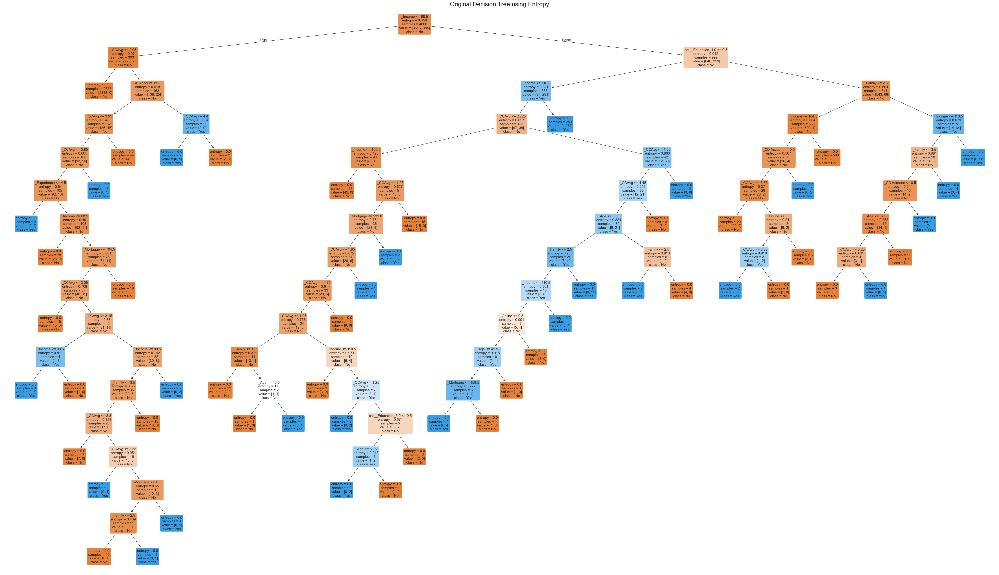

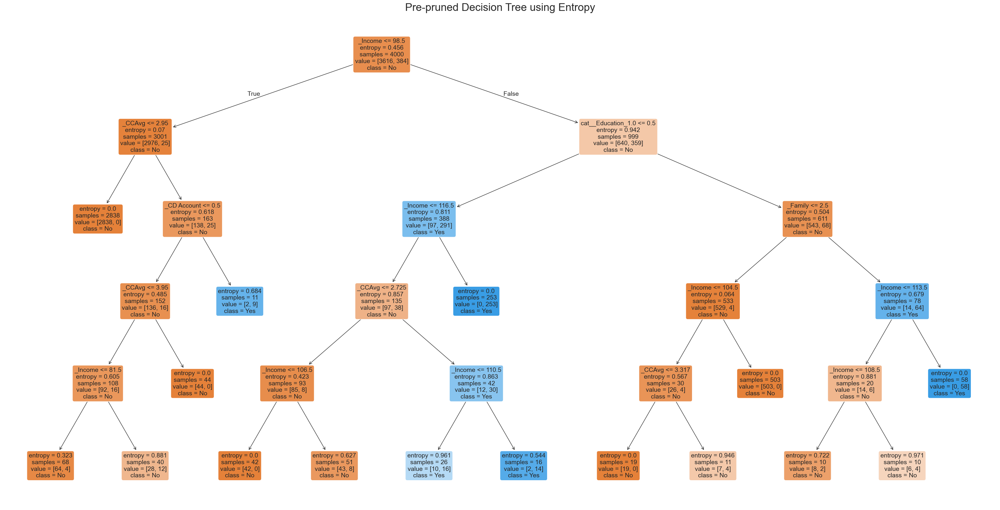

In [15]:
from sklearn.tree import plot_tree

# Define the function to plot the decision trees with enhanced clarity
def plot_tree_with_clarity(tree_classifier, title, file_name, figsize):
    plt.figure(figsize=figsize)  # Use the provided figure size for better readability
    plot_tree(tree_classifier, filled=True, feature_names=modified_feature_names,
              class_names=['No', 'Yes'], rounded=True, fontsize=14)
    plt.title(title, fontsize=24)  # Increase the title font size
    plt.savefig(file_name, format='jpg')
    plt.show()

# Plot the normal Decision Tree with enhanced clarity
plot_tree_with_clarity(original_entropy_tree, "Original Decision Tree using Entropy", 'entropy.jpg', figsize=(70, 40))

# Plot the pre-pruned Decision Tree with enhanced clarity
plot_tree_with_clarity(pre_pruned_entropy_tree, "Pre-pruned Decision Tree using Entropy", 'entropypreprune.jpg', figsize=(40, 20))

### Kui Xuan Marc Soo ###


### Model Evaluation **[10 points]**
1. **[6 points]** To evaluate the performance of your classifier use:
     - **[2 points]** execution time.
     - **[2 points]** Accuracy.
     - **[2 points]** confusion matrix.
2. **[2 points]** Analyze, explain, and comment on your result.
3. **[2 points]** How does the Number of training sample affect performance (accuracy, time, etc.)? Explain and draw a graph.

#### **1.** Evaluate the performance : Execution Time

In [16]:
# Measure execution time for Gini Decision Tree
start_time = time.time()
original_gini_tree.fit(X_train, y_train)
y_pred_gini = original_gini_tree.predict(X_test)
end_time = time.time()
execution_time_gini = end_time - start_time
print(f"Execution Time (Gini): {execution_time_gini:.4f} seconds")

# Measure execution time for Entropy Decision Tree
start_time = time.time()
original_entropy_tree.fit(X_train, y_train)
y_pred_entropy = original_entropy_tree.predict(X_test)
end_time = time.time()
execution_time_entropy = end_time - start_time
print(f"Execution Time (Entropy): {execution_time_entropy:.4f} seconds")

### Kui Xuan Marc Soo ###

Execution Time (Gini): 0.0051 seconds
Execution Time (Entropy): 0.0036 seconds


#### **2.** Evaluate the performance : Accuracy

In [17]:
# Calculate accuracy for Gini Decision Tree
accuracy_gini = accuracy_score(y_test, y_pred_gini)
print(f"Accuracy (Gini): {accuracy_gini:.4f}")

# Calculate accuracy for Entropy Decision Tree
accuracy_entropy = accuracy_score(y_test, y_pred_entropy)
print(f"Accuracy (Entropy): {accuracy_entropy:.4f}")

### Kui Xuan Marc Soo ###

Accuracy (Gini): 0.9710
Accuracy (Entropy): 0.9750


#### **3.** Evaluate the performance : Confusion Matrix

Confusion Matrix (Gini):
[[891  13]
 [ 16  80]]


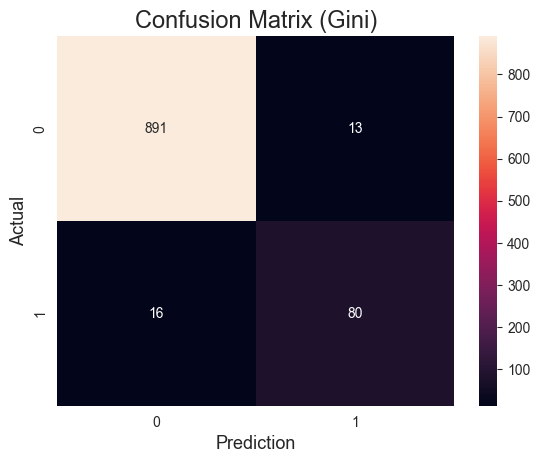

Confusion Matrix (Entropy):
[[893  11]
 [ 14  82]]


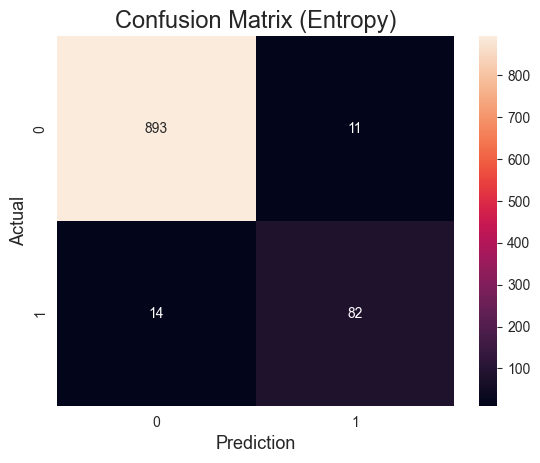

In [18]:
# Generate confusion matrix for Gini Decision Tree
conf_matrix_gini = confusion_matrix(y_test, y_pred_gini)
print("Confusion Matrix (Gini):")
print(conf_matrix_gini)
cm = confusion_matrix(y_test, y_pred_gini)
sns.heatmap(cm, 
            annot=True,
            fmt='g')
plt.xlabel('Prediction',fontsize=13)
plt.ylabel('Actual',fontsize=13)
plt.title('Confusion Matrix (Gini)',fontsize=17)
plt.show()

# Generate confusion matrix for Entropy Decision Tree
conf_matrix_entropy = confusion_matrix(y_test, y_pred_entropy)
print("Confusion Matrix (Entropy):")
print(conf_matrix_entropy)
cm = confusion_matrix(y_test, y_pred_entropy)
sns.heatmap(cm, 
            annot=True,
            fmt='g')
plt.xlabel('Prediction',fontsize=13)
plt.ylabel('Actual',fontsize=13)
plt.title('Confusion Matrix (Entropy)',fontsize=17)
plt.show()

**2. Analyze, explain, and comment on your result.**

Answer:
---
Execution Time: Entropy DT executed its prediction at a faster time of 0.0092s compared to Gini DT of 0.0121s.

Accuracy: Entropy DT has a higher accuracy of 0.9750 compared to Gini DT of 0.9710.

Confusion Matrix: Entropy DT has a slightly better prediction result of 4 more than Gini DT.

Overall, both DTs are very similar in terms of efficiency and precision, but from the actual values of each result, Entropy DT performed a touch better than Gini DT.

**3. How does the Number of training sample affect performance (accuracy, time, etc.)? Explain and draw a graph.**

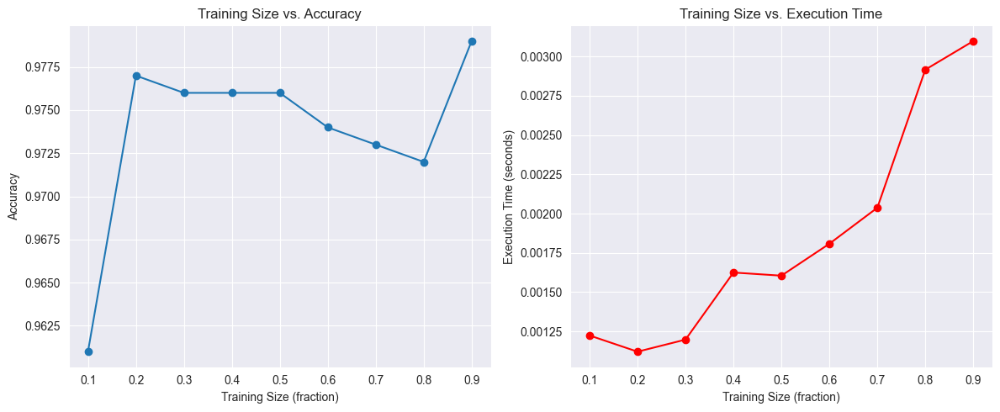

In [19]:
# Define the fractions of the training set to use
training_sizes = np.linspace(0.1, 0.9, 9)

# Arrays to store the results
accuracy_list = []
time_list = []

for size in training_sizes:
    # Split the data
    X_train_part, _, y_train_part, _ = train_test_split(X_train, y_train, train_size=size, random_state=42)
    
    # Initialize and train the model
    dt_model = DecisionTreeClassifier(criterion='gini', random_state=42)
    start = time.time()
    dt_model.fit(X_train_part, y_train_part)
    stop = time.time()
    
    # Predict and calculate metrics
    y_predict = dt_model.predict(X_test)
    accuracy_list.append(accuracy_score(y_test, y_predict))
    time_list.append(stop - start)

# Plotting the results
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(training_sizes, accuracy_list, marker='o')
plt.title('Training Size vs. Accuracy')
plt.xlabel('Training Size (fraction)')
plt.ylabel('Accuracy')
plt.grid(True)

# Execution time plot
plt.subplot(1, 2, 2)
plt.plot(training_sizes, time_list, marker='o', color='r')
plt.title('Training Size vs. Execution Time')
plt.xlabel('Training Size (fraction)')
plt.ylabel('Execution Time (seconds)')
plt.grid(True)

plt.tight_layout()
plt.show()

### Kui Xuan Marc Soo ###

#### **Analyze and Explain result of the graphs**

Explain on your finding

Answer:
---
For the accuracy of the DT, it generally drops from 20%-80% of the training dataset, until the 90% of the training dataset where it has the highest accuracy. The graph shows that with bigger training size, the accuracy drops as there are more instances that would factor into the splits, but it would lead to better generalisation. However for the 90%, there might be overfitting of the dataset, which would explain the high accuracy.

For the execution time of the DT, it generally follows the trend where the higher the training size of the training dataset, the longer the execution time. The graph shows that with a bigger training size, there are more instances that would need to be considered into the DT model, and that would cause the program to take a longer time to compute.

### Tree Prunning **[33 points]**
1. Implement the following pruning methods for both Decision Trees (Gini and Entropy):
    - **[5 points]** maximum depth
          - What is the best depth limit to use for this data? Use 5-fold cross validation for selection.
    - **[5 points]** minimum number of samples. Use 5-fold cross validation to decide.
    - **[5 points]** [cost complexity pruning](https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py)
2. **[10 points]** Compare the overall accuracy of Decision Trees using different pruning methods in terms of accuracy and time. Next, make sure to compare that with a fully grown tree.
3. **[8 points]** Plot and interpret all pruned trees.

#### **1.** [Pruning] Maximum depth : Gini 

Optimal depth for Gini: 5 with cross-validation accuracy: 0.9835
Accuracy of pruned Decision Tree (Gini): 0.9760
Confusion Matrix for pruned Decision Tree (Gini):
[[893  11]
 [ 13  83]]


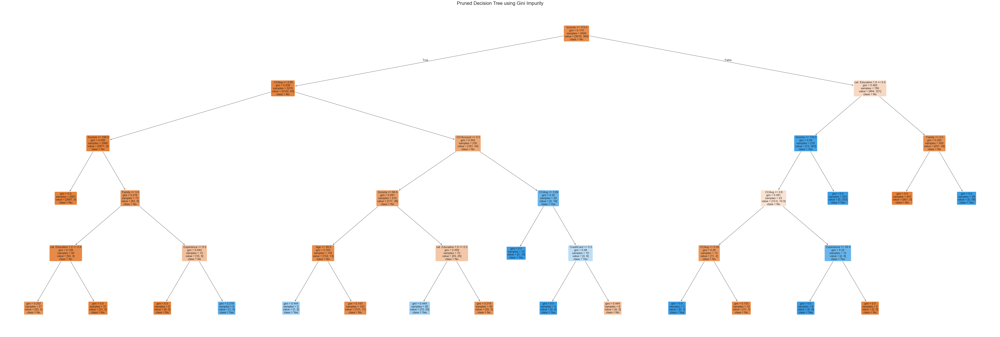

In [20]:
# Define the parameter grid for maximum depth
depth_grid = {'max_depth': list(range(1, 21))}

# Set up the Decision Tree classifier with Gini impurity criterion
dt_gini = DecisionTreeClassifier(criterion='gini', random_state=42)

# Utilize GridSearchCV for cross-validated grid-search over a parameter grid
grid_search_gini = GridSearchCV(estimator=dt_gini, param_grid=depth_grid, cv=5, scoring='accuracy')

# Execute grid search on the training data
grid_search_gini.fit(X_train, y_train)

# Extract the optimal parameters and scores from the grid search
max_depth_gini = grid_search_gini.best_params_['max_depth']
max_gini_score = grid_search_gini.best_score_

print(f"Optimal depth for Gini: {max_depth_gini} with cross-validation accuracy: {max_gini_score:.4f}")

# Train the final model with the optimal depth
max_pruned_gini_tree = DecisionTreeClassifier(criterion='gini', max_depth=max_depth_gini, random_state=42)
max_pruned_gini_tree.fit(X_train, y_train)

# Predict and evaluate the pruned Gini Decision Tree
predictions_gini = max_pruned_gini_tree.predict(X_test)
gini_accuracy = accuracy_score(y_test, predictions_gini)
gini_conf_matrix = confusion_matrix(y_test, predictions_gini)

print(f"Accuracy of pruned Decision Tree (Gini): {gini_accuracy:.4f}")
print(f"Confusion Matrix for pruned Decision Tree (Gini):\n{gini_conf_matrix}")

# Function to clean up feature names
def clean_feature_names(feature_names):
    return [name.replace('remainder_', '').replace('_', ' ') for name in feature_names]

# Clean the feature names
cleaned_feature_names = clean_feature_names(preprocessor.get_feature_names_out())

# Visualize the pruned Gini Decision Tree with improved clarity
plt.figure(figsize=(90, 30))  # Increase the figure size for better readability

# Plot the pruned Gini Decision Tree
plot_tree(max_pruned_gini_tree, filled=True, feature_names=cleaned_feature_names,
               class_names=['No', 'Yes'], rounded=True, fontsize=14)
plt.title("Pruned Decision Tree using Gini Impurity", fontsize=24)  # Increase the title font size
plt.savefig('maxprunegini.jpg', format='jpg')
plt.show()

### Herman Soh ###

#### [Pruning] Maximum depth : Entropy 

Optimal depth for Entropy: 6 with cross-validation accuracy: 0.9862
Accuracy of pruned Decision Tree (Entropy): 0.9770
Confusion Matrix for pruned Decision Tree (Entropy):
[[895   9]
 [ 14  82]]


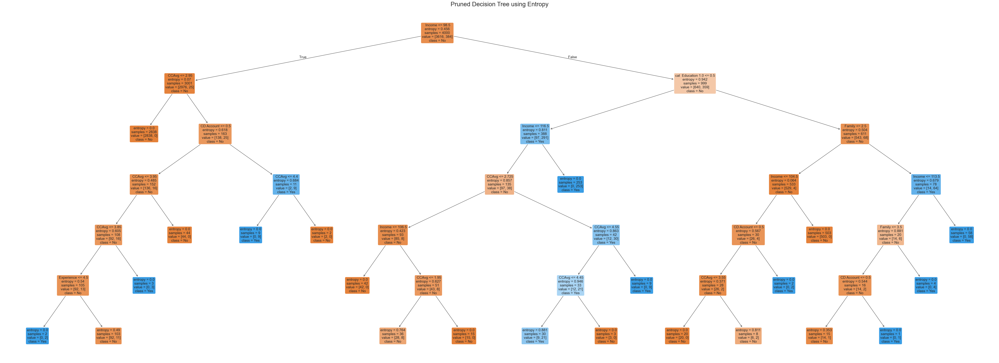

In [21]:
# Define the parameter grid for maximum depth
depth_grid = {'max_depth': list(range(1, 21))}

# Initialize the Decision Tree classifier with Entropy criterion
dt_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)

# Utilize GridSearchCV for cross-validated grid-search over a parameter grid
grid_search_entropy = GridSearchCV(estimator=dt_entropy, param_grid=depth_grid, cv=5, scoring='accuracy')

# Execute grid search on the training data
grid_search_entropy.fit(X_train, y_train)

# Extract the optimal parameters and scores from the grid search
max_depth_entropy = grid_search_entropy.best_params_['max_depth']
max_entropy_score = grid_search_entropy.best_score_

print(f"Optimal depth for Entropy: {max_depth_entropy} with cross-validation accuracy: {max_entropy_score:.4f}")

# Train the final model with the optimal depth
max_pruned_entropy_tree = DecisionTreeClassifier(criterion='entropy', max_depth=max_depth_entropy, random_state=42)
max_pruned_entropy_tree.fit(X_train, y_train)

# Predict and evaluate the pruned Entropy Decision Tree
predictions_entropy = max_pruned_entropy_tree.predict(X_test)
entropy_accuracy = accuracy_score(y_test, predictions_entropy)
entropy_conf_matrix = confusion_matrix(y_test, predictions_entropy)

print(f"Accuracy of pruned Decision Tree (Entropy): {entropy_accuracy:.4f}")
print(f"Confusion Matrix for pruned Decision Tree (Entropy):\n{entropy_conf_matrix}")

# Function to clean up feature names
def clean_feature_names(feature_names):
    return [name.replace('remainder_', '').replace('_', ' ') for name in feature_names]

# Clean the feature names
cleaned_feature_names = clean_feature_names(preprocessor.get_feature_names_out())

# Visualize the pruned Entropy Decision Tree with improved clarity
plt.figure(figsize=(70, 25))  # Increase the figure size for better readability

# Plot the pruned Entropy Decision Tree
plot_tree(max_pruned_entropy_tree, filled=True, feature_names=cleaned_feature_names,
          class_names=['No', 'Yes'], rounded=True, fontsize=14)
plt.title("Pruned Decision Tree using Entropy", fontsize=24)  # Increase the title font size
plt.savefig('maxpruneentropy.jpg', format='jpg')
plt.show()

### Herman Soh ###

#### **Comments and explain the best depth limit**

Comments and explain the best depth limit to use for this data based on pruned Decision Trees

#### [Pruning] Minimum number of samples : Gini 

Optimal Parameters for Gini Tree: {'min_samples_leaf': 2, 'min_samples_split': 10}
Accuracy of Optimal Pruned Decision Tree (Gini): 0.9710
Confusion Matrix for Optimal Pruned Decision Tree (Gini):
 [[891  13]
 [ 16  80]]


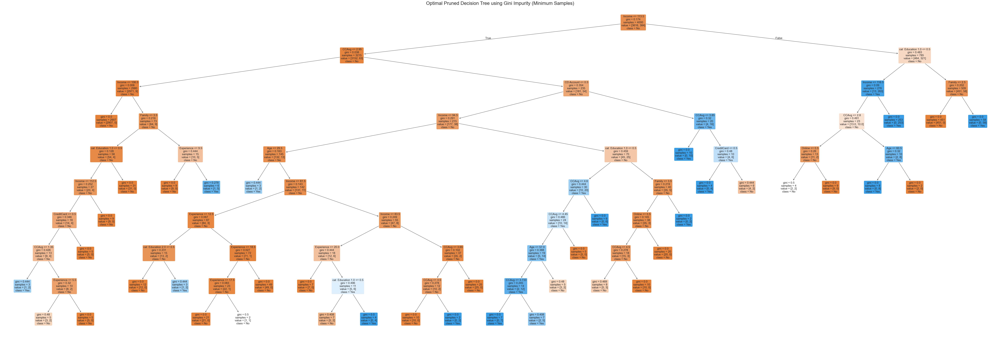

In [22]:
# Define the parameter grid for minimum samples split and leaf
split_leaf_grid = {
    'min_samples_split': [2, 5, 10, 20, 50],
    'min_samples_leaf': [1, 2, 5, 10, 20]
}

# Initialize the Decision Tree classifier for Gini criterion
dt_gini = DecisionTreeClassifier(criterion='gini', random_state=42)

# Utilize GridSearchCV for cross-validated grid-search over a parameter grid
grid_search_gini = GridSearchCV(estimator=dt_gini, param_grid=split_leaf_grid, cv=5, scoring='accuracy')

# Execute grid search on the training data
grid_search_gini.fit(X_train, y_train)

# Extract the optimal parameters and the best model from the grid search
optimal_params_gini = grid_search_gini.best_params_
min_pruned_gini_tree = grid_search_gini.best_estimator_

print(f"Optimal Parameters for Gini Tree: {optimal_params_gini}")

# Predict and evaluate the optimal Gini Decision Tree
predictions_gini = min_pruned_gini_tree.predict(X_test)
gini_accuracy = accuracy_score(y_test, predictions_gini)
gini_conf_matrix = confusion_matrix(y_test, predictions_gini)

print(f"Accuracy of Optimal Pruned Decision Tree (Gini): {gini_accuracy:.4f}")
print("Confusion Matrix for Optimal Pruned Decision Tree (Gini):\n", gini_conf_matrix)

# Function to clean up feature names
def clean_feature_names(feature_names):
    return [name.replace('remainder_', '').replace('_', ' ') for name in feature_names]

# Clean the feature names
cleaned_feature_names = clean_feature_names(preprocessor.get_feature_names_out())

# Visualize the optimal Gini Decision Tree with improved clarity
plt.figure(figsize=(90, 30))  # Increase the figure size for better readability

# Plot the optimal Gini Decision Tree
tree.plot_tree(min_pruned_gini_tree, filled=True, feature_names=cleaned_feature_names,
               class_names=['No', 'Yes'], rounded=True, fontsize=14)
plt.title("Optimal Pruned Decision Tree using Gini Impurity (Minimum Samples)", fontsize=24)  # Increase the title font size
plt.savefig('minsamplegini.jpg', format='jpg')
plt.show()

### Herman Soh ###

#### [Pruning] Minimum number of samples : Entropy 

Optimal Parameters for Entropy Tree: {'min_samples_leaf': 1, 'min_samples_split': 50}
Accuracy of Optimal Pruned Decision Tree (Entropy): 0.9780
Confusion Matrix for Optimal Pruned Decision Tree (Entropy):
 [[897   7]
 [ 15  81]]


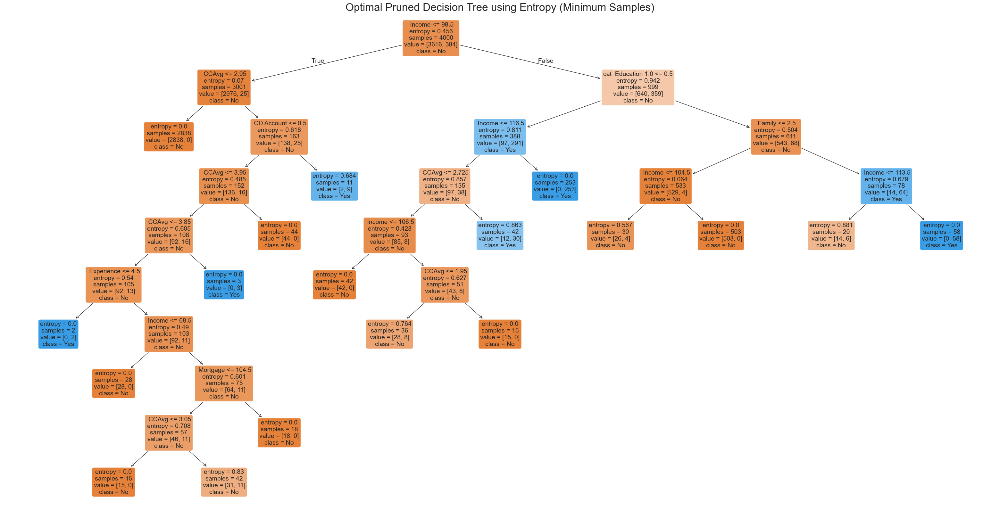

In [23]:
# Define the parameter grid for minimum samples split and leaf
split_leaf_entropy_grid = {
    'min_samples_split': [2, 5, 10, 20, 50],
    'min_samples_leaf': [1, 2, 5, 10, 20]
}

# Initialize the Decision Tree classifier for Entropy criterion
dt_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)

# Utilize GridSearchCV for cross-validated grid-search over a parameter grid
grid_search_entropy = GridSearchCV(estimator=dt_entropy, param_grid=split_leaf_entropy_grid, cv=5, scoring='accuracy')

# Execute grid search on the training data
grid_search_entropy.fit(X_train, y_train)

# Extract the optimal parameters and the best model from the grid search
optimal_params_entropy = grid_search_entropy.best_params_
min_pruned_entropy_tree = grid_search_entropy.best_estimator_

print(f"Optimal Parameters for Entropy Tree: {optimal_params_entropy}")

# Predict and evaluate the optimal Entropy Decision Tree
predictions_entropy = min_pruned_entropy_tree.predict(X_test)
entropy_accuracy = accuracy_score(y_test, predictions_entropy)
entropy_conf_matrix = confusion_matrix(y_test, predictions_entropy)

print(f"Accuracy of Optimal Pruned Decision Tree (Entropy): {entropy_accuracy:.4f}")
print("Confusion Matrix for Optimal Pruned Decision Tree (Entropy):\n", entropy_conf_matrix)

# Function to clean up feature names
def clean_feature_names(feature_names):
    return [name.replace('remainder_', '').replace('_', ' ') for name in feature_names]

# Clean the feature names
cleaned_feature_names = clean_feature_names(preprocessor.get_feature_names_out())

# Visualize the optimal Entropy Decision Tree with improved clarity
plt.figure(figsize=(40, 20))  # Increase the figure size for better readability

# Plot the optimal Entropy Decision Tree
tree.plot_tree(min_pruned_entropy_tree, filled=True, feature_names=cleaned_feature_names,
               class_names=['No', 'Yes'], rounded=True, fontsize=14)
plt.title("Optimal Pruned Decision Tree using Entropy (Minimum Samples)", fontsize=24)  # Increase the title font size
plt.savefig('minsampleentropy.jpg', format='jpg')
plt.show()

### Herman Soh ###

#### [Pruning] Cost complexity pruning : Gini

Optimal alpha for Gini Tree: 0.0011799331103678932
Accuracy of Optimal Pruned Decision Tree (Gini): 0.9810
Confusion Matrix for Optimal Pruned Decision Tree (Gini):
 [[899   5]
 [ 14  82]]


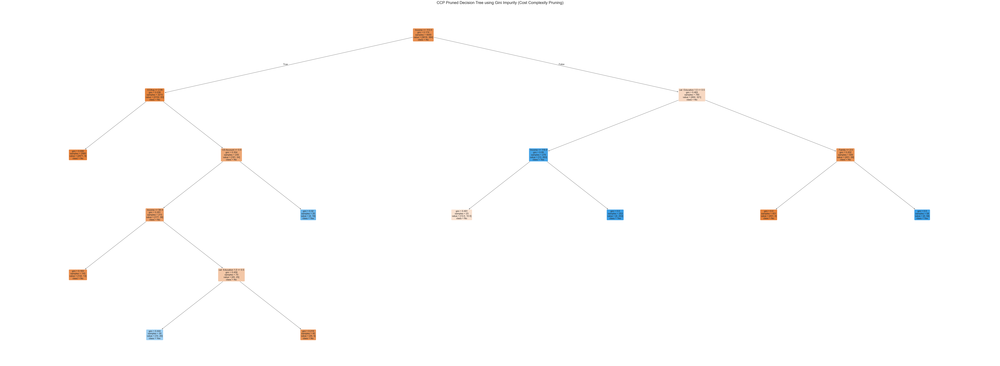

In [24]:
# Full Decision Tree to obtain cost complexity pruning path
full_gini_tree = DecisionTreeClassifier(criterion='gini', random_state=42)
full_gini_tree.fit(X_train, y_train)

# Obtain ccp_alphas and impurities for cost complexity pruning
ccp_path = full_gini_tree.cost_complexity_pruning_path(X_train, y_train)
alphas, impurities = ccp_path.ccp_alphas, ccp_path.impurities

# Lists to store decision trees and their scores
pruned_trees = []
train_acc = []
test_acc = []

# Train decision trees for each alpha and store their performance
for alpha in alphas:
    pruned_gini_tree = DecisionTreeClassifier(criterion='gini', random_state=42, ccp_alpha=alpha)
    pruned_gini_tree.fit(X_train, y_train)
    pruned_trees.append(pruned_gini_tree)
    train_acc.append(pruned_gini_tree.score(X_train, y_train))
    test_acc.append(pruned_gini_tree.score(X_test, y_test))

# Select the best alpha based on test accuracy
optimal_alpha = alphas[np.argmax(test_acc)]
ccp_gini_tree = pruned_trees[np.argmax(test_acc)]

# Predict and evaluate the optimal pruned Gini tree
optimal_gini_predictions = ccp_gini_tree.predict(X_test)
optimal_gini_accuracy = accuracy_score(y_test, optimal_gini_predictions)
optimal_gini_conf_matrix = confusion_matrix(y_test, optimal_gini_predictions)

print(f"Optimal alpha for Gini Tree: {optimal_alpha}")
print(f"Accuracy of Optimal Pruned Decision Tree (Gini): {optimal_gini_accuracy:.4f}")
print("Confusion Matrix for Optimal Pruned Decision Tree (Gini):\n", optimal_gini_conf_matrix)

# Clean feature names for better readability
def clean_feature_names(feature_names):
    return [name.replace('remainder_', '').replace('_', ' ') for name in feature_names]

# Obtain and clean feature names
cleaned_feature_names = clean_feature_names(preprocessor.get_feature_names_out())

# Plot the optimal pruned Gini tree with enhanced clarity
plt.figure(figsize=(110, 40))  # Increase figure size for better readability

# Plot the pruned Decision Tree using Gini Impurity (Cost Complexity Pruning)
plot_tree(ccp_gini_tree, filled=True, feature_names=cleaned_feature_names,
          class_names=['No', 'Yes'], rounded=True, fontsize=14)
plt.title("CCP Pruned Decision Tree using Gini Impurity (Cost Complexity Pruning)", fontsize=24)  # Increase title font size
plt.savefig('ccpgini.jpg', format='jpg')
plt.show()

### Herman Soh ###

#### [Pruning] Cost complexity pruning : Entropy 

Optimal alpha for Entropy Tree: 0.0016501950126606608
Accuracy of Optimal Pruned Decision Tree (Entropy): 0.9800
Confusion Matrix for Optimal Pruned Decision Tree (Entropy):
 [[898   6]
 [ 14  82]]


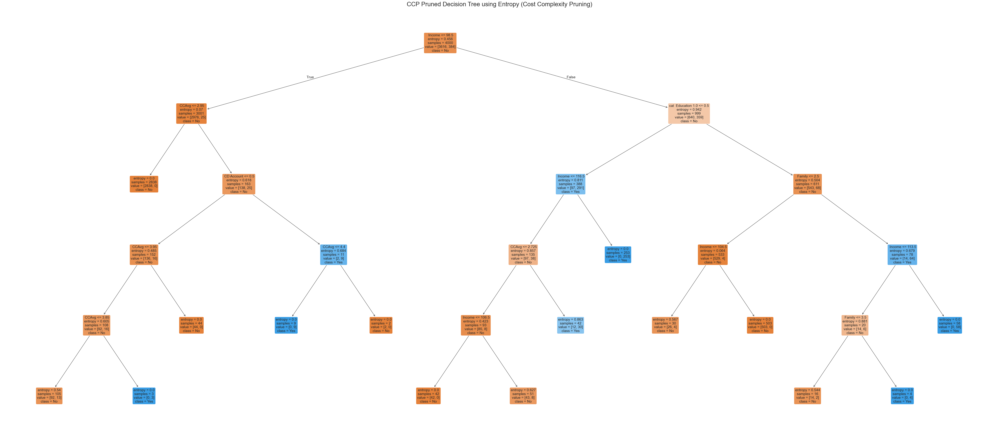

In [25]:
# Full Decision Tree to obtain cost complexity pruning path
complete_entropy_tree = DecisionTreeClassifier(criterion='entropy', random_state=42)
complete_entropy_tree.fit(X_train, y_train)

# Obtain ccp_alphas and impurities for cost complexity pruning
pruning_path = complete_entropy_tree.cost_complexity_pruning_path(X_train, y_train)
alphas, impurities = pruning_path.ccp_alphas, pruning_path.impurities

# Lists to store decision trees and their scores
pruned_trees = []
train_accuracies = []
test_accuracies = []

# Train decision trees for each alpha and store their performance
for alpha in alphas:
    pruned_entropy_tree = DecisionTreeClassifier(criterion='entropy', random_state=42, ccp_alpha=alpha)
    pruned_entropy_tree.fit(X_train, y_train)
    pruned_trees.append(pruned_entropy_tree)
    train_accuracies.append(pruned_entropy_tree.score(X_train, y_train))
    test_accuracies.append(pruned_entropy_tree.score(X_test, y_test))

# Select the best alpha based on test accuracy
optimal_alpha = alphas[np.argmax(test_accuracies)]
ccp_entropy_tree = pruned_trees[np.argmax(test_accuracies)]

# Predict and evaluate the optimal pruned Entropy tree
optimal_entropy_predictions = ccp_entropy_tree.predict(X_test)
optimal_entropy_accuracy = accuracy_score(y_test, optimal_entropy_predictions)
optimal_entropy_conf_matrix = confusion_matrix(y_test, optimal_entropy_predictions)

print(f"Optimal alpha for Entropy Tree: {optimal_alpha}")
print(f"Accuracy of Optimal Pruned Decision Tree (Entropy): {optimal_entropy_accuracy:.4f}")
print("Confusion Matrix for Optimal Pruned Decision Tree (Entropy):\n", optimal_entropy_conf_matrix)

# Clean feature names for better readability
def clean_feature_names(feature_names):
    return [name.replace('remainder_', '').replace('_', ' ') for name in feature_names]

# Obtain and clean feature names
cleaned_feature_names = clean_feature_names(preprocessor.get_feature_names_out())

# Plot the optimal pruned Entropy tree with enhanced clarity
plt.figure(figsize=(70, 30))  # Increase the figure size for better readability

# Plot the pruned Decision Tree using Entropy (Cost Complexity Pruning)
plot_tree(ccp_entropy_tree, filled=True, feature_names=cleaned_feature_names,
          class_names=['No', 'Yes'], rounded=True, fontsize=14)
plt.title("CCP Pruned Decision Tree using Entropy (Cost Complexity Pruning)", fontsize=24)  # Increase title font size
plt.savefig('ccpentropy.jpg', format='jpg')
plt.show()

### Herman Soh ###

#### **2.** Compare accuracy and time of Decision Trees using different pruning methods

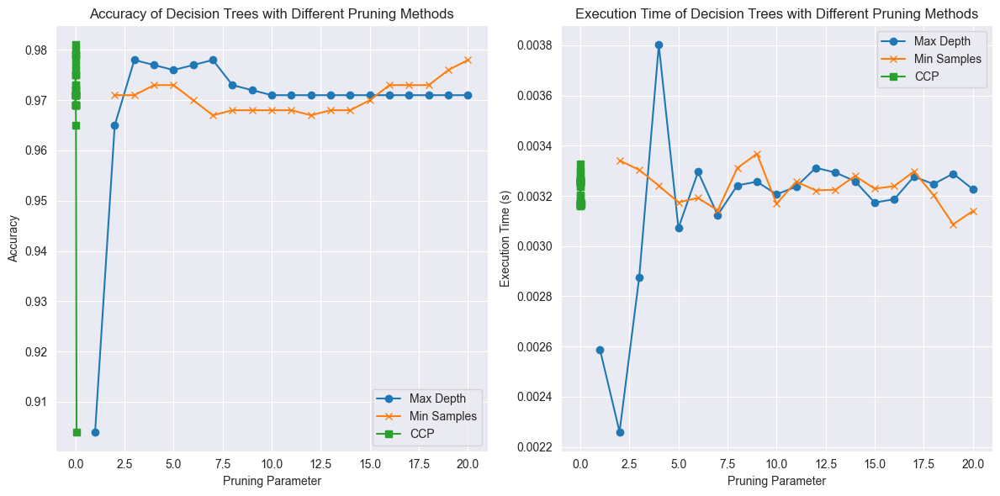

Best Accuracy for Max Depth Pruning: 0.9780 at depth 3
Fastest Execution Time for Max Depth Pruning: 0.0023s at depth 2

Best Accuracy for Min Samples Pruning: 0.9780 at min samples 20
Fastest Execution Time for Min Samples Pruning: 0.0031s at min samples 19

Best Accuracy for Cost Complexity Pruning: 0.9810 at ccp_alpha 0.0011799331103678932
Fastest Execution Time for Cost Complexity Pruning: 0.0032s at ccp_alpha 0.0021018928762363


In [26]:
def evaluate_tree_performance(tree, X_train, y_train, X_test, y_test):
    start_time = time.time()
    tree.fit(X_train, y_train)
    end_time = time.time()
    y_pred = tree.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    execution_time = end_time - start_time
    return accuracy, execution_time

# Maximum Depth Pruning
depths = range(1, 21)
depth_accuracies = []
depth_times = []

for depth in depths:
    tree = DecisionTreeClassifier(criterion='gini', max_depth=depth, random_state=42)
    accuracy, execution_time = evaluate_tree_performance(tree, X_train, y_train, X_test, y_test)
    depth_accuracies.append(accuracy)
    depth_times.append(execution_time)

# Minimum Number of Samples Pruning
min_samples = range(2, 21)
samples_accuracies = []
samples_times = []

for min_sample in min_samples:
    tree = DecisionTreeClassifier(criterion='gini', min_samples_split=min_sample, random_state=42)
    accuracy, execution_time = evaluate_tree_performance(tree, X_train, y_train, X_test, y_test)
    samples_accuracies.append(accuracy)
    samples_times.append(execution_time)

# Cost Complexity Pruning
path = DecisionTreeClassifier(criterion='gini', random_state=42).cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

ccp_accuracies = []
ccp_times = []

for ccp_alpha in ccp_alphas:
    tree = DecisionTreeClassifier(criterion='gini', random_state=42, ccp_alpha=ccp_alpha)
    accuracy, execution_time = evaluate_tree_performance(tree, X_train, y_train, X_test, y_test)
    ccp_accuracies.append(accuracy)
    ccp_times.append(execution_time)

# Plotting the results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(depths, depth_accuracies, marker='o', label='Max Depth')
plt.plot(min_samples, samples_accuracies, marker='x', label='Min Samples')
plt.plot(ccp_alphas, ccp_accuracies, marker='s', label='CCP')
plt.xlabel('Pruning Parameter')
plt.ylabel('Accuracy')
plt.title('Accuracy of Decision Trees with Different Pruning Methods')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(depths, depth_times, marker='o', label='Max Depth')
plt.plot(min_samples, samples_times, marker='x', label='Min Samples')
plt.plot(ccp_alphas, ccp_times, marker='s', label='CCP')
plt.xlabel('Pruning Parameter')
plt.ylabel('Execution Time (s)')
plt.title('Execution Time of Decision Trees with Different Pruning Methods')
plt.legend()

plt.tight_layout()
plt.show()

# Maximum Depth Pruning
best_depth_accuracy = max(zip(depth_accuracies, depths), key=lambda x: x[0])
fastest_depth_time = min(zip(depth_times, depths), key=lambda x: x[0])

# Minimum Number of Samples Pruning
best_samples_accuracy = max(zip(samples_accuracies, min_samples), key=lambda x: x[0])
fastest_samples_time = min(zip(samples_times, min_samples), key=lambda x: x[0])

# Cost Complexity Pruning
best_ccp_accuracy = max(zip(ccp_accuracies, ccp_alphas), key=lambda x: x[0])
fastest_ccp_time = min(zip(ccp_times, ccp_alphas), key=lambda x: x[0])

# Print results
print(f"Best Accuracy for Max Depth Pruning: {best_depth_accuracy[0]:.4f} at depth {best_depth_accuracy[1]}")
print(f"Fastest Execution Time for Max Depth Pruning: {fastest_depth_time[0]:.4f}s at depth {fastest_depth_time[1]}")
print()
print(f"Best Accuracy for Min Samples Pruning: {best_samples_accuracy[0]:.4f} at min samples {best_samples_accuracy[1]}")
print(f"Fastest Execution Time for Min Samples Pruning: {fastest_samples_time[0]:.4f}s at min samples {fastest_samples_time[1]}")
print()
print(f"Best Accuracy for Cost Complexity Pruning: {best_ccp_accuracy[0]:.4f} at ccp_alpha {best_ccp_accuracy[1]}")
print(f"Fastest Execution Time for Cost Complexity Pruning: {fastest_ccp_time[0]:.4f}s at ccp_alpha {fastest_ccp_time[1]}")

### Herman Soh ###

#### **Compare the overall accuracy of Decision Trees using different pruning methods in terms of accuracy and time.**

Answer:
---
Using the Gini DT as the base DT type, it shows that the best pruning method for accuracy is cost complexity pruning with 0.9810 accuracy, and the best pruning method for execution time is max depth pruning at 0.0042s.

#### **Compare pruned trees with a fully grown trees.**

Answer:
---
Comparing the pruned trees with a fully grown tree, it is evident that the pruned trees are much smaller in depth and splits. Each pruned tree generally aims to limit the size of the tree, which would make prediction and computing much easier and faster. However, the one main difference between the fully grown tree and pruned trees is that the fully grown tree aims to have the gini impurity/entropy of every leaf node be 0, whereas the leaf nodes of the pruned trees still have some gini impurity/entropy. This shows that the class at the leaf node is not purely just the predicted class, but the majority class. This could affect the accuracy of the prediction, but it is better for generalisation.

#### **3.** Plot and interpret all pruned trees

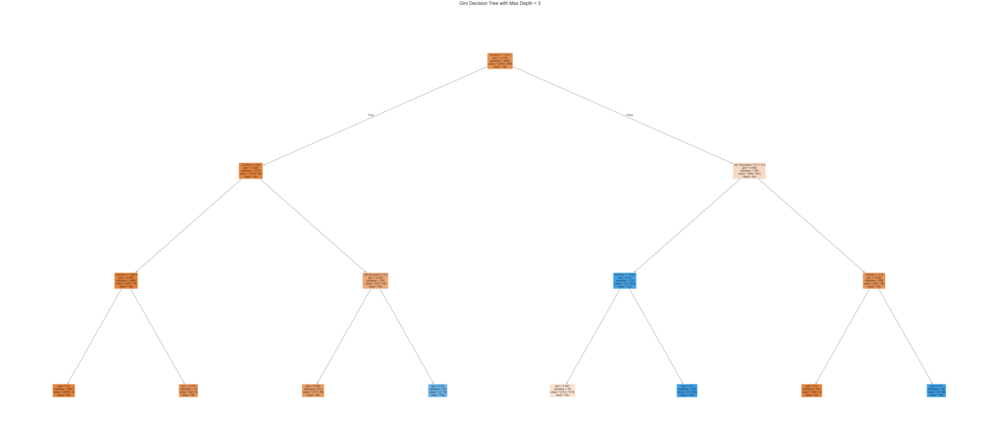

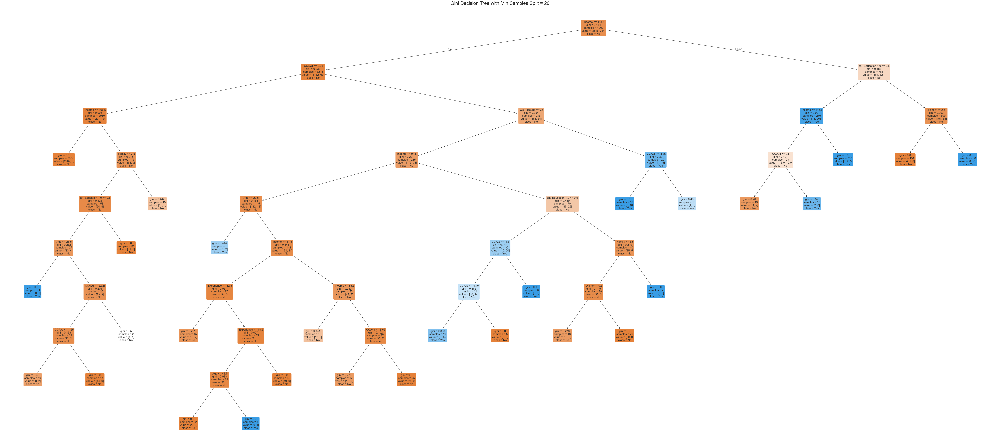

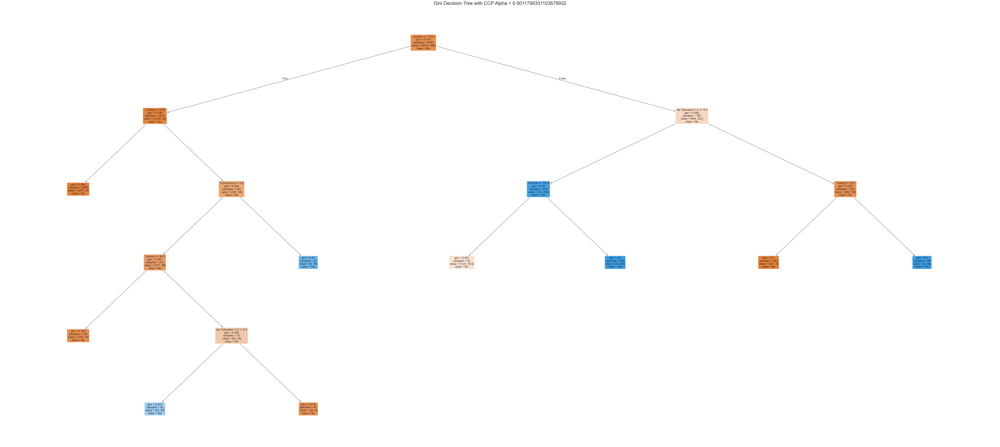

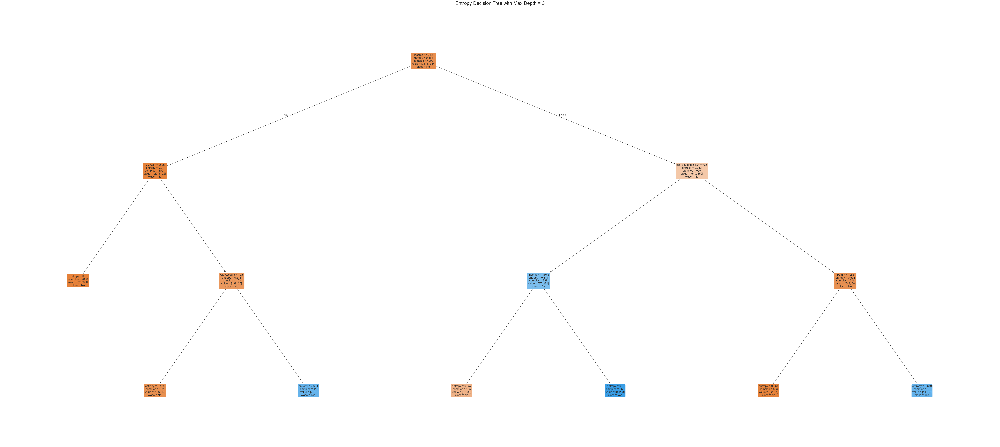

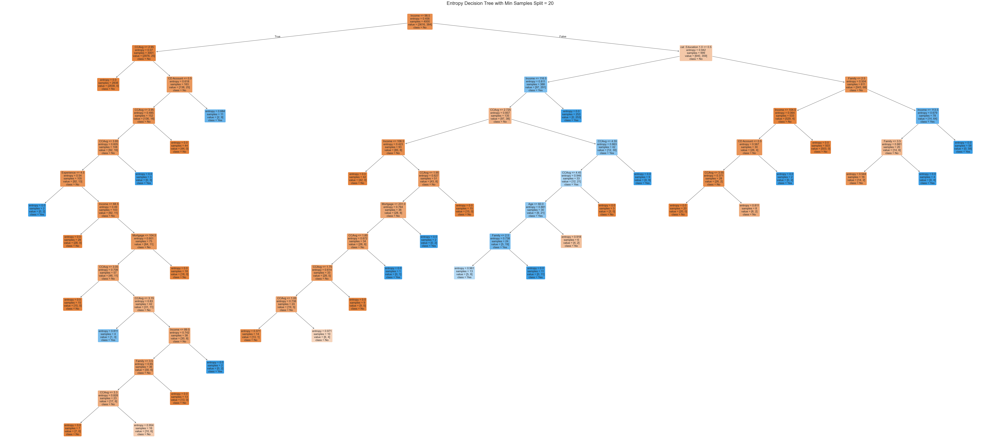

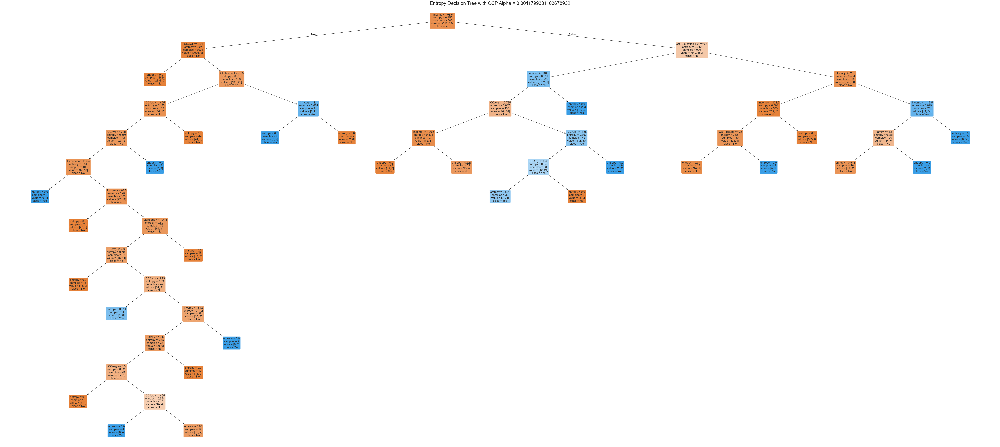

In [28]:
# Function to replace 'remainder_' and underscores in feature names
def replace_remainder_and_underscores(feature_names):
    return [name.replace('remainder_', '').replace('_', ' ') for name in feature_names]

# Function to plot and interpret decision trees
def plot_and_interpret_tree(tree, title):
    modified_feature_names = replace_remainder_and_underscores(preprocessor.get_feature_names_out())
    plt.figure(figsize=(90, 40))
    plot_tree(tree, filled=True, feature_names=modified_feature_names, class_names=['No', 'Yes'], rounded=True, fontsize=14)
    plt.title(title, fontsize=24)
    plt.show()

# Maximum Depth Pruning
best_max_depth = depths[np.argmax(depth_accuracies)]
gini_tree_max_depth = DecisionTreeClassifier(criterion='gini', max_depth=best_max_depth, random_state=42)
gini_tree_max_depth.fit(X_train, y_train)
plot_and_interpret_tree(gini_tree_max_depth, f"Gini Decision Tree with Max Depth = {best_max_depth}")

# Minimum Number of Samples Pruning
best_min_samples = min_samples[np.argmax(samples_accuracies)]
gini_tree_min_samples = DecisionTreeClassifier(criterion='gini', min_samples_split=best_min_samples, random_state=42)
gini_tree_min_samples.fit(X_train, y_train)
plot_and_interpret_tree(gini_tree_min_samples, f"Gini Decision Tree with Min Samples Split = {best_min_samples}")

# Cost Complexity Pruning
best_ccp_alpha = ccp_alphas[np.argmax(ccp_accuracies)]
gini_tree_ccp = DecisionTreeClassifier(criterion='gini', random_state=42, ccp_alpha=best_ccp_alpha)
gini_tree_ccp.fit(X_train, y_train)
plot_and_interpret_tree(gini_tree_ccp, f"Gini Decision Tree with CCP Alpha = {best_ccp_alpha}")

# Repeat the same steps for Entropy-based trees

# Maximum Depth Pruning
entropy_tree_max_depth = DecisionTreeClassifier(criterion='entropy', max_depth=best_max_depth, random_state=42)
entropy_tree_max_depth.fit(X_train, y_train)
plot_and_interpret_tree(entropy_tree_max_depth, f"Entropy Decision Tree with Max Depth = {best_max_depth}")

# Minimum Number of Samples Pruning
entropy_tree_min_samples = DecisionTreeClassifier(criterion='entropy', min_samples_split=best_min_samples, random_state=42)
entropy_tree_min_samples.fit(X_train, y_train)
plot_and_interpret_tree(entropy_tree_min_samples, f"Entropy Decision Tree with Min Samples Split = {best_min_samples}")

# Cost Complexity Pruning
entropy_tree_ccp = DecisionTreeClassifier(criterion='entropy', random_state=42, ccp_alpha=best_ccp_alpha)
entropy_tree_ccp.fit(X_train, y_train)
plot_and_interpret_tree(entropy_tree_ccp, f"Entropy Decision Tree with CCP Alpha = {best_ccp_alpha}")

### Herman Soh ###

#### **Summary**

Answer:
---
How the code works is through a few steps:
- Step 1: Open the file and pre-process the data.
- Step 2: Use the graphs and matrices to visualise the data and the features are related to each other.
- Step 3: Use One-Hot Encoding to represent categorical features to binary columns.
- Step 4: Split the dataset.
- Step 5: Build the DTs (using both Gini Impurity and Entropy)
- Step 6: Visualise the Dts.
- Step 7: Evaluate the performance of each DTs (execution time, accuracy, confusion matrix)
- Step 8: Pruning the DTs (max depth, min no. of samples, cost complexity pruning)

Evaluation Matrices:

Execution Times:
- Gini: 0.0121s

- Entropy: 0.0092s

Accuracies:
- Gini: 0.9710

- Entropy: 0.9750

Discussion: 

Overall, the group feels that both DTs gives similar results in terms of execution time and accuracy. However, there is a slight edge to the Entropy DT tree, as it generally gave a better accuracy and execution time. 

Things that could have been improved would be the method to fill bad or missing data during data pre-processing. The accuracy for the KNN used to predict the missing values was not as high as the group would like. This could be due to the skewed value of features like mortgage where the difference in data value is very large, and the number of '0's is almost proportionate to the other values, which affects the KNN prediction. The group still feel that this is the most efficient way to fill the bad/missing datas.

Conclusion and summary:

For this assignment, it shows how Decision Trees models are built based on different methods of how nodes are split, as well as how complex the decision tree should be. It gave the group an in-depth understanding of how decision trees work, and the man different ways to build the model and evaluate them. 

The group also acknowledges the importance of understanding the data given and pre-processing it for any machine learning algorithms, be it Decision Trees or other algorithms. Understanding the dataset helps to get an idea of how the algorithm model should work, and pre-processing the dataset allows the model to be built to have the most optimal performance. Pre-processing sets the foundation of the model, and if there are changes to the pre-processing, there would be repercussions to the prediction, so it is of high importance to try and get the best dataset possible.